# Questions ouvertes

Ce notebook a pour but de développer des fonctions nécessaires et utilisables sur les questions fermées des trois questionnaires des Assises de l'enseignement supérieur organisé par la région Île-De-France. 

Plusieurs types de représentations des textes peuvent être considérés:
- Tf-idf

- Word-Embeddings

De même, plusieurs types de fonctions sont à considérer, suivant différents buts:



In [1]:
#Loading packages
import numpy as np
import pandas as pd
import sys

import pandas as pd
import numpy as np
import datetime
import os


import string
import spacy 
import nltk
from normalise import normalise
from nltk.tokenize import word_tokenize

from sklearn.feature_extraction.text import TfidfVectorizer

import spacy.lang.fr
import spacy

global spacy_nlp
spacy_nlp = spacy.load('fr_core_news_sm')
import normalise

STOPWORDS = spacy.lang.fr.stop_words.STOP_WORDS

import string


from sklearn.decomposition import PCA
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE


import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.cluster import KMeans
from sklearn.feature_selection import chi2

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from textwrap import wrap

from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.datasets import fetch_20newsgroups
from sklearn.decomposition import NMF, LatentDirichletAllocation

C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\base.py:306: UserWarning: Trying to unpickle estimator LabelPropagation from version 0.18 when using version 0.21.3. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)
C:\Users\adrie\Anaconda3\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
pd.set_option('display.max_columns', 50)
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_colwidth', 500)

## Importing DATA

### Contributions

Création d'un dictionnaire pour faciliter l'affichage :

In [3]:
questionnaires = {
    'chercheurs, enseignants-chercheurs et ingénieurs.xlsx':'Questionnaire à destination des chercheurs, enseignants-chercheurs et ingénieurs',
    'enseignants ou personnels encadrants des campus.xlsx':'Questionnaire à destination des enseignants ou personnels encadrants des campus',
    'étudiants.xlsx':'Questionnaire à destination des étudiants'
}

In [4]:
filenames = list(questionnaires.keys())
themes = list(questionnaires.values())

In [5]:
filepaths = [os.path.join('Data/',filename) for filename in filenames]

Définition de la colonne `Created`, de type `date`

In [6]:
col_date = ['Created']

In [7]:
df_list = [pd.read_excel(filepath, parse_dates=col_date) for filepath in filepaths]

Colonnes communes à tous les datasets (tous les thèmes):

Cela permettra d'extraire les questions de chaque thème, puisque les seules colonnes qui ne sont pas en commun à tous les thèmes sont les colonnes qui correspondent aux questions.

In [8]:
col_common = ['Created']

On affiche des informations générales sur les thèmes:

In [9]:
df_infos = pd.DataFrame({
     'Questionnaire': themes,
     'nombre de sondés': [df.shape[0] for df in df_list],
     'nombre de questions': [sum(~df.columns.isin(col_common)) for df in df_list]
    })
df_infos

,Questionnaire,nombre de sondés,nombre de questions
0,"Questionnaire à destination des chercheurs, enseignants-chercheurs et ingénieurs",242,12
1,Questionnaire à destination des enseignants ou personnels encadrants des campus,37,22
2,Questionnaire à destination des étudiants,623,21


### Definitions des questions

In [10]:
df_def_questions=pd.read_csv('Data/utilities/df_def_questions.csv')

In [11]:
df_def_questions['type de la sous question'].unique()

array(['cmq', 'cq', 'oq', 'mixed_tq_insatisfaisant',
       'multi_mixed_cq_autre'], dtype=object)

In [12]:
df_def_open_questions=df_def_questions[df_def_questions['type de la sous question']=='mixed_tq_insatisfaisant'].reset_index(drop=True)

On définit un nombre de clusters pour chaque question (pour changer après)

In [12]:
#df_def_open_questions['n_clusters']=3

## Observation des résultats

In [13]:
for a in ['falloir', 'être', 'déjà', 'bon', 'faire', 'mettre']:
    spacy_nlp.vocab[a].is_stop=True

C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\cluster\k_means_.py:972: ConvergenceWarning: Number of distinct clusters (3) found smaller than n_clusters (4). Possibly due to duplicate points in X.
  return_n_iter=True)
C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\cluster\k_means_.py:972: ConvergenceWarning: Number of distinct clusters (3) found smaller than n_clusters (5). Possibly due to duplicate points in X.
  return_n_iter=True)
C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\cluster\k_means_.py:972: ConvergenceWarning: Number of distinct clusters (3) found smaller than n_clusters (6). Possibly due to duplicate points in X.
  return_n_iter=True)
C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\cluster\k_means_.py:972: ConvergenceWarning: Number of distinct clusters (3) found smaller than n_clusters (7). Possibly due to duplicate points in X.
  return_n_iter=True)
C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\cluster\k_means_.py:972: ConvergenceWarning: Number o

C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\cluster\k_means_.py:972: ConvergenceWarning: Number of distinct clusters (3) found smaller than n_clusters (5). Possibly due to duplicate points in X.
  return_n_iter=True)
C:\Users\adrie\AppData\Roaming\Python\Python37\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\cluster\k_means_.py:972: ConvergenceWarning: Number of distinct clusters (3) found smaller than n_clusters (6). Possibly due to duplicate points in X.
  return_n_iter=True)
C:\Users\adrie\AppData\Roaming\Python\Python37\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created th

C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\cluster\k_means_.py:972: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (6). Possibly due to duplicate points in X.
  return_n_iter=True)
C:\Users\adrie\AppData\Roaming\Python\Python37\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\cluster\k_means_.py:972: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (7). Possibly due to duplicate points in X.
  return_n_iter=True)
C:\Users\adrie\AppData\Roaming\Python\Python37\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created th

C:\Users\adrie\AppData\Roaming\Python\Python37\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\cluster\k_means_.py:972: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (6). Possibly due to duplicate points in X.
  return_n_iter=True)
C:\Users\adrie\AppData\Roaming\Python\Python37\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeW

C:\Users\adrie\AppData\Roaming\Python\Python37\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\cluster\k_means_.py:972: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (6). Possibly due to duplicate points in X.
  return_n_iter=True)
C:\Users\adrie\AppData\Roaming\Python\Python37\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeW

C:\Users\adrie\AppData\Roaming\Python\Python37\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\cluster\k_means_.py:972: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (6). Possibly due to duplicate points in X.
  return_n_iter=True)
C:\Users\adrie\AppData\Roaming\Python\Python37\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeW

C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\cluster\k_means_.py:972: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (5). Possibly due to duplicate points in X.
  return_n_iter=True)
C:\Users\adrie\AppData\Roaming\Python\Python37\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\cluster\k_means_.py:972: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (6). Possibly due to duplicate points in X.
  return_n_iter=True)
C:\Users\adrie\AppData\Roaming\Python\Python37\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created th

C:\Users\adrie\AppData\Roaming\Python\Python37\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\cluster\k_means_.py:972: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (5). Possibly due to duplicate points in X.
  return_n_iter=True)
C:\Users\adrie\AppData\Roaming\Python\Python37\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeW

C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\cluster\k_means_.py:972: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (6). Possibly due to duplicate points in X.
  return_n_iter=True)
C:\Users\adrie\AppData\Roaming\Python\Python37\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\cluster\k_means_.py:972: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (7). Possibly due to duplicate points in X.
  return_n_iter=True)
C:\Users\adrie\AppData\Roaming\Python\Python37\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created th

C:\Users\adrie\AppData\Roaming\Python\Python37\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\cluster\k_means_.py:972: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (7). Possibly due to duplicate points in X.
  return_n_iter=True)
C:\Users\adrie\AppData\Roaming\Python\Python37\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeW

C:\Users\adrie\AppData\Roaming\Python\Python37\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\adrie\AppData\Roaming\Python\Python37\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\adrie\AppData\Roaming\Python\Python37\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) 

C:\Users\adrie\AppData\Roaming\Python\Python37\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\cluster\k_means_.py:972: ConvergenceWarning: Number of distinct clusters (3) found smaller than n_clusters (8). Possibly due to duplicate points in X.
  return_n_iter=True)
C:\Users\adrie\AppData\Roaming\Python\Python37\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeW

C:\Users\adrie\AppData\Roaming\Python\Python37\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\adrie\AppData\Roaming\Python\Python37\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\adrie\AppData\Roaming\Python\Python37\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) 

C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\cluster\k_means_.py:972: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  return_n_iter=True)
C:\Users\adrie\AppData\Roaming\Python\Python37\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\cluster\k_means_.py:972: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (4). Possibly due to duplicate points in X.
  return_n_iter=True)
C:\Users\adrie\AppData\Roaming\Python\Python37\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created th

C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\cluster\k_means_.py:972: ConvergenceWarning: Number of distinct clusters (3) found smaller than n_clusters (4). Possibly due to duplicate points in X.
  return_n_iter=True)
C:\Users\adrie\AppData\Roaming\Python\Python37\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\cluster\k_means_.py:972: ConvergenceWarning: Number of distinct clusters (3) found smaller than n_clusters (5). Possibly due to duplicate points in X.
  return_n_iter=True)
C:\Users\adrie\AppData\Roaming\Python\Python37\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created th

C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\cluster\k_means_.py:972: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (5). Possibly due to duplicate points in X.
  return_n_iter=True)
C:\Users\adrie\AppData\Roaming\Python\Python37\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\cluster\k_means_.py:972: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (6). Possibly due to duplicate points in X.
  return_n_iter=True)
C:\Users\adrie\AppData\Roaming\Python\Python37\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created th

C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\cluster\k_means_.py:972: ConvergenceWarning: Number of distinct clusters (6) found smaller than n_clusters (7). Possibly due to duplicate points in X.
  return_n_iter=True)
C:\Users\adrie\AppData\Roaming\Python\Python37\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\cluster\k_means_.py:972: ConvergenceWarning: Number of distinct clusters (6) found smaller than n_clusters (8). Possibly due to duplicate points in X.
  return_n_iter=True)


Wall time: 9min 26s


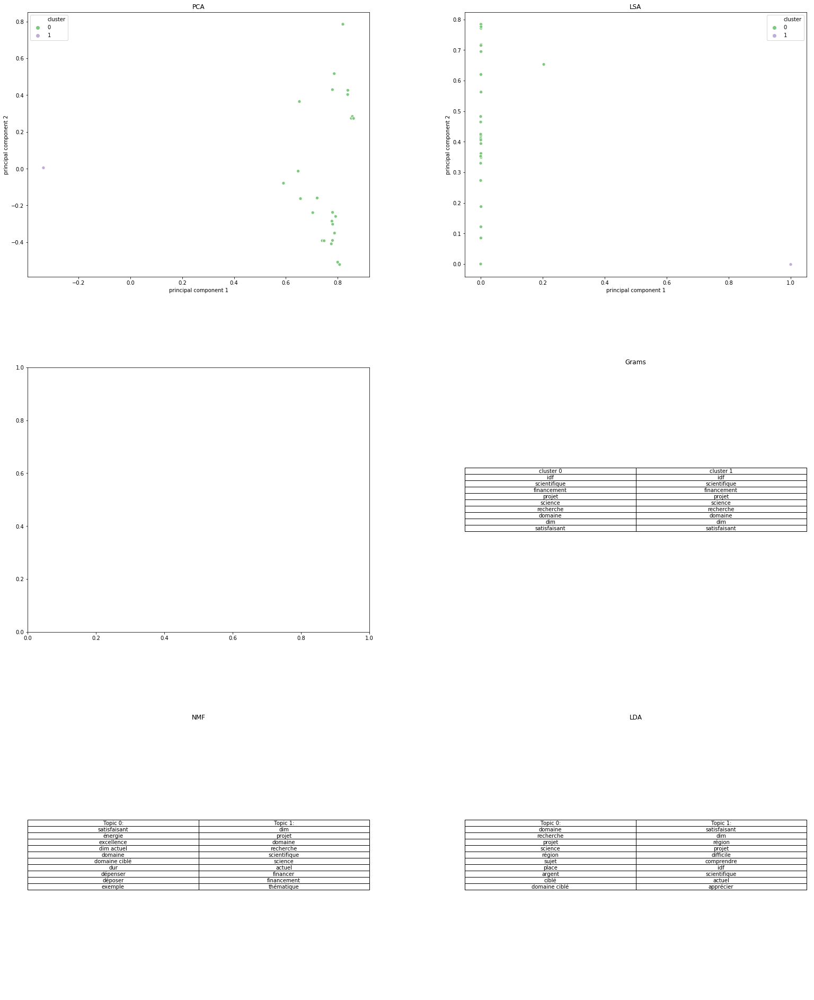

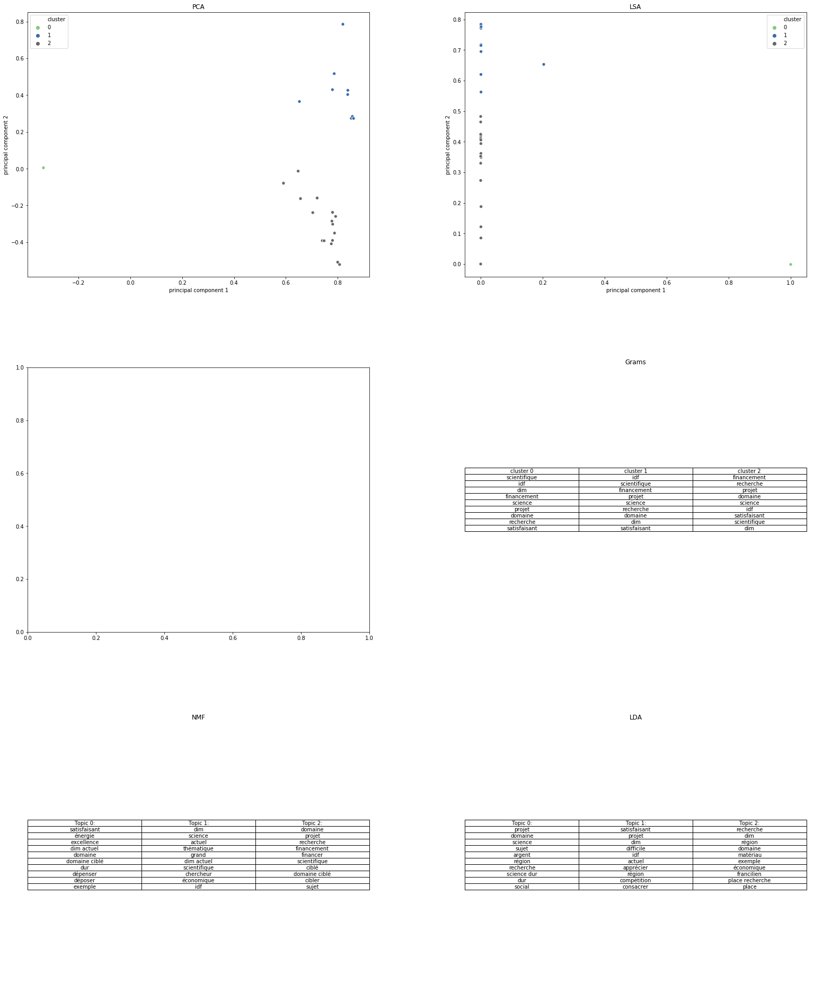

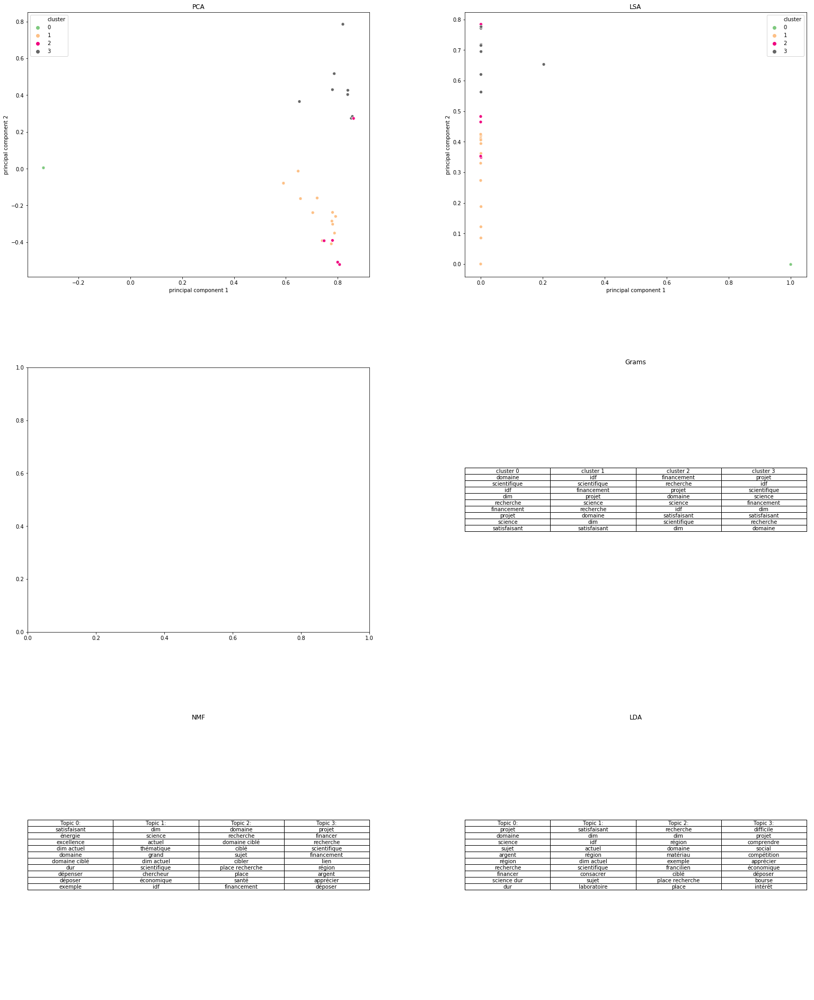

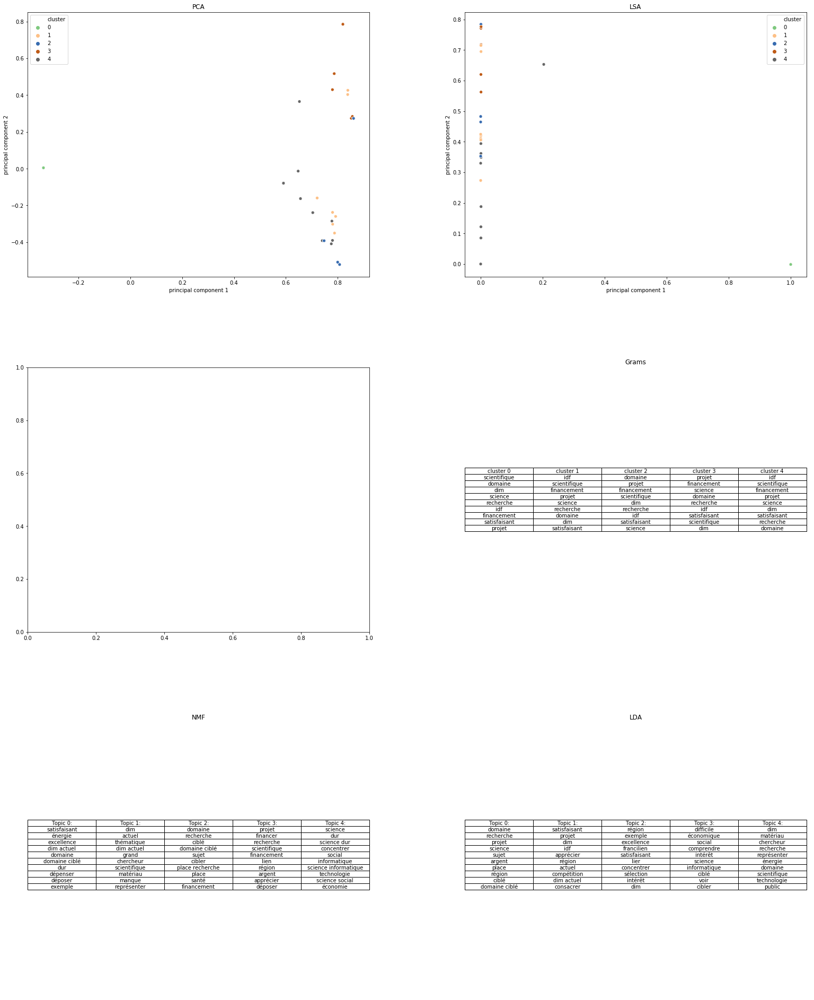

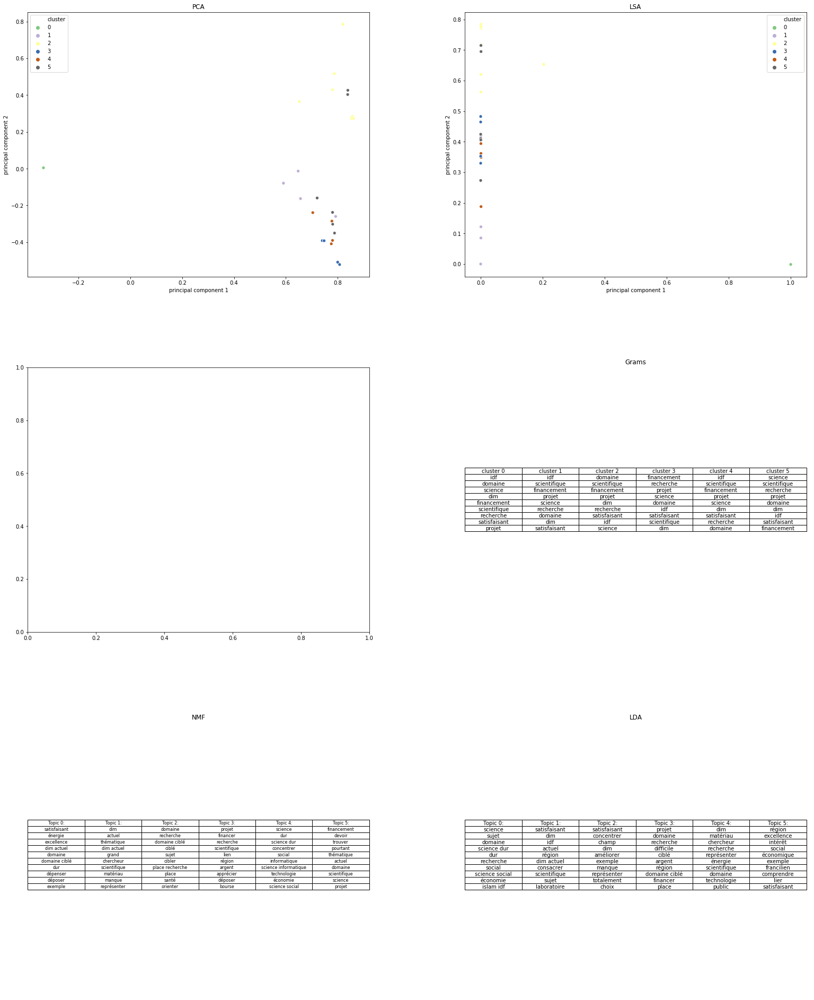

...

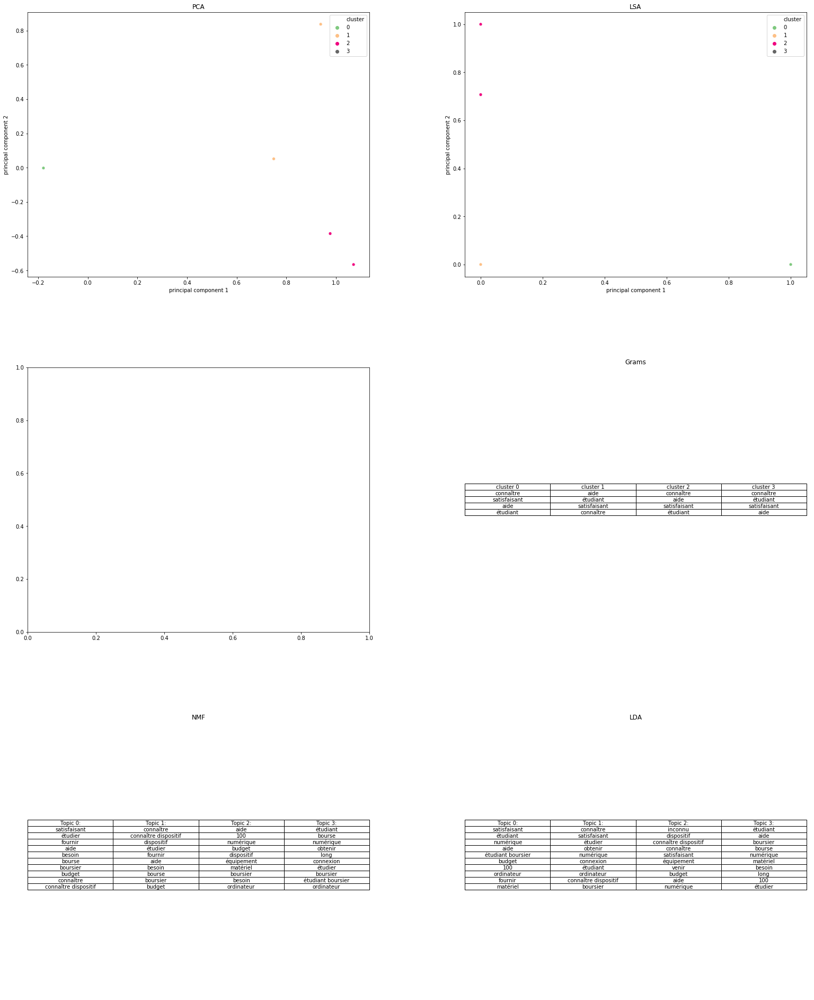

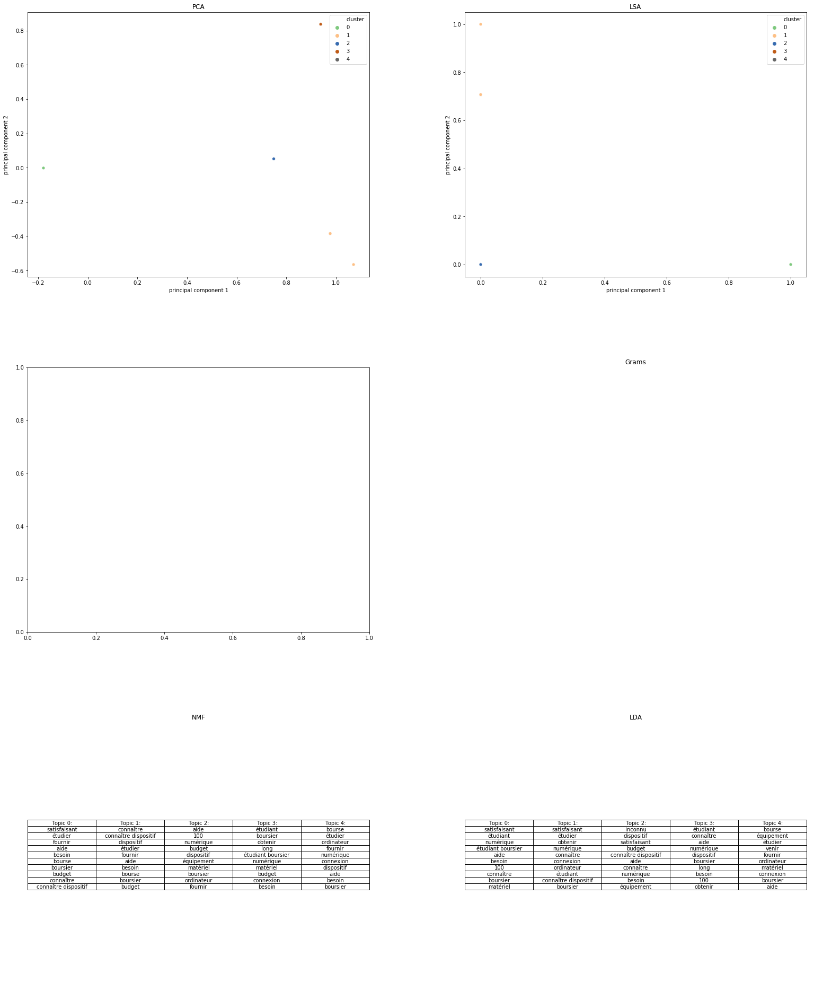

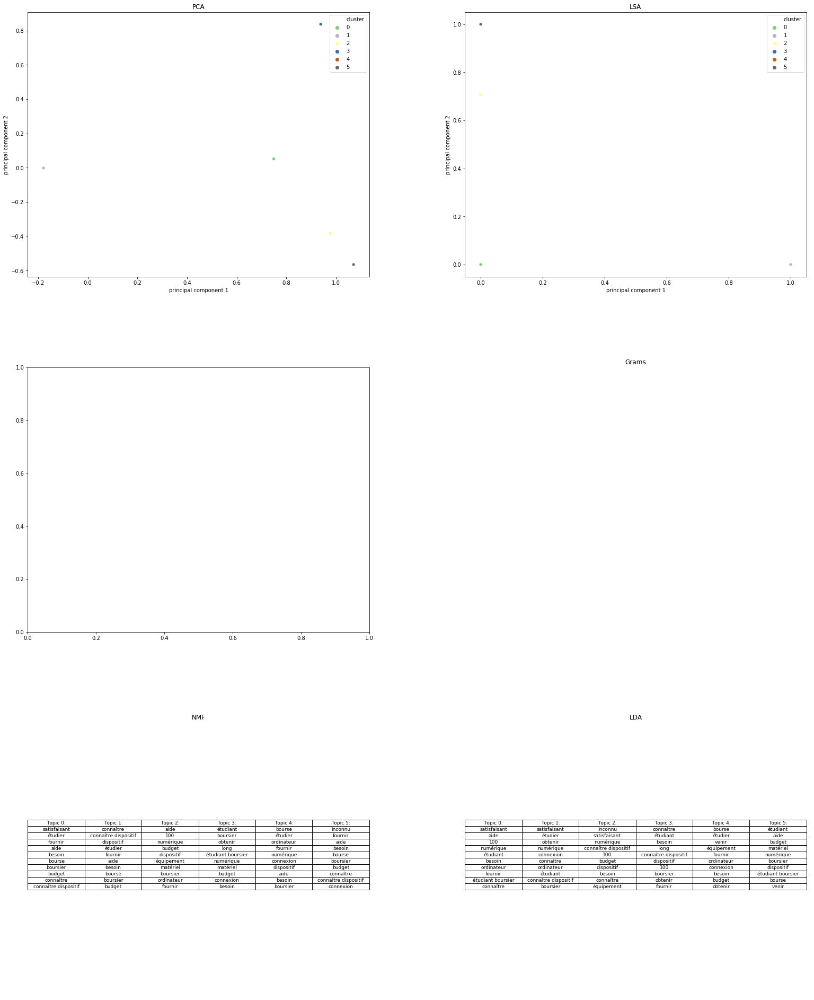

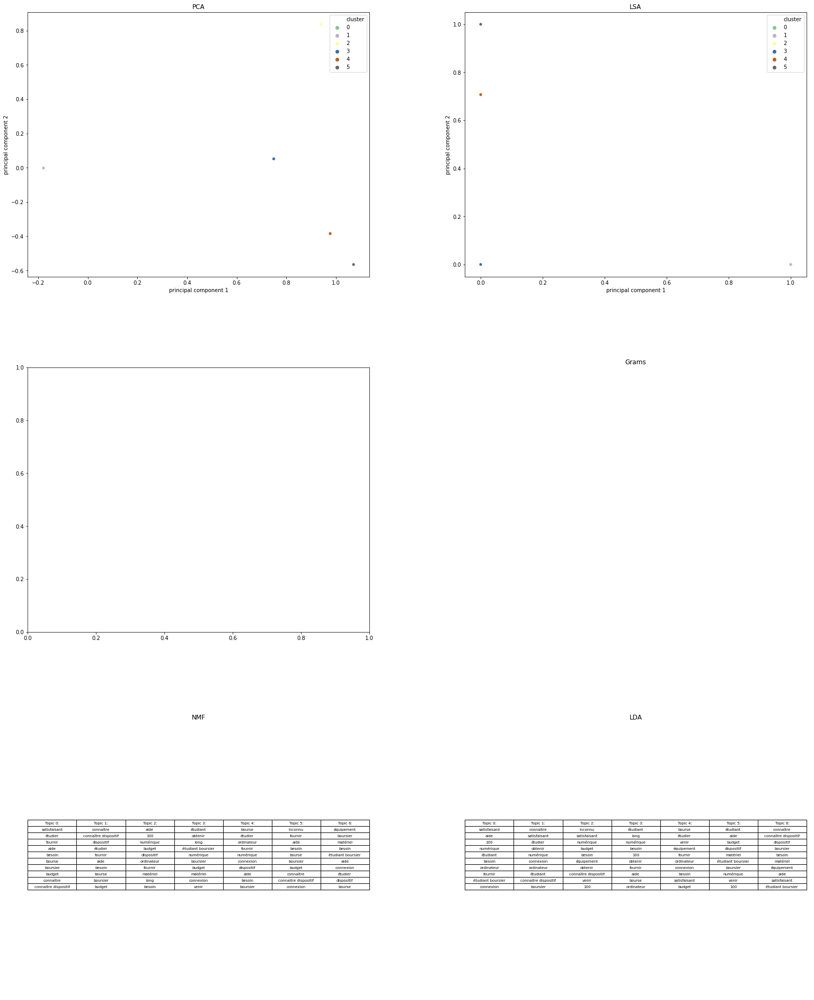

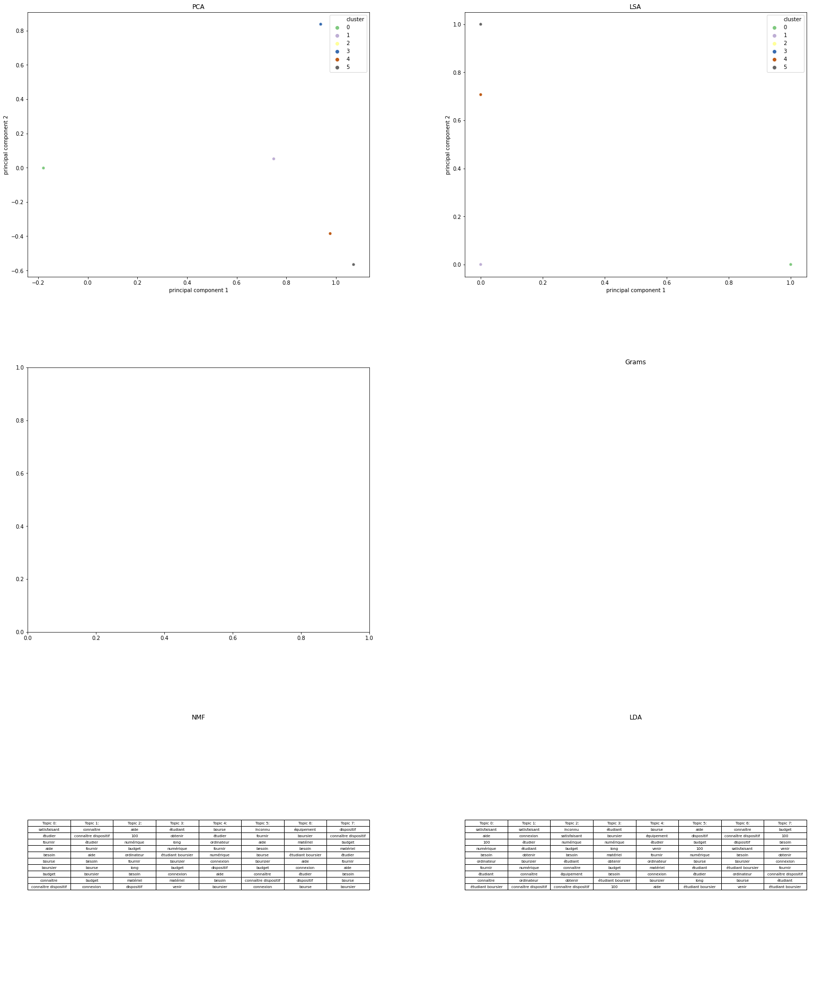

In [34]:
%time plot_questions_ouvertes_clusters_viz(df_list, themes, df_def_open_questions)

## Fonctions générales

In [33]:
def plot_questions_ouvertes_clusters_viz(df_list, themes, df_def):
    """
    
    
    """
    #On sélectionne chaque questionnaire un par un:hh
    for n_questionnaire in range(len(themes)):

        #On selectionne seulement les colonnes du questionnaire considéré:
        df_def_temp=df_def[df_def['numero questionnaire']==n_questionnaire].reset_index(drop=True)
        df_def_temp=df_def_temp[df_def_temp['type de la sous question']=='mixed_tq_insatisfaisant'].reset_index(drop=True)
        


        df_def_temp=df_def_temp.reset_index(drop=True)
        #On affiche l'histogramme des réponses pour chaque question:    
        for index, row in df_def_temp.iterrows():              
            #tfidf_matrix: 
            col_name=row['sous question']
            df_temp=pd.DataFrame()
            df_temp['preprocessed']=df_list[n_questionnaire][col_name].copy()
            df_temp=df_temp.dropna()
            df_temp['preprocessed']=df_temp['preprocessed'].astype(str).apply(preprocessing_part)
            df_temp.reset_index(inplace=True, drop=True)
            try: 
                tfidf, tfidf_matrix=transform_text(df_temp, 'preprocessed')
            except:
                pass
            
            
            #On boucle sur le nombre de clusters:
            for number_clusters in range(2,9):
                
                n=6
                ncols=2
                nrows=(n)//ncols
                fig,ax = plt.subplots(nrows, ncols, figsize=(25,10*nrows))
                fig.tight_layout(pad=15)

                index_fig=0
            
                #On compute les clusters:
                try:
                    df_labels=compute_kmeans(tfidf_matrix, number_clusters)
                except:
                    pass
                #Plotting PCA:
                plt.sca(ax.flatten()[index_fig])
                try:
                    compute_PCA_with_clusters(tfidf_matrix, df_labels)
                except:
                    pass
                index_fig+=1
                #Plotting LSA:
                plt.sca(ax.flatten()[index_fig])
                try:
                    compute_LSA_with_clusters(tfidf_matrix, df_labels)
                except:
                    pass
                index_fig+=1
                #Plotting PCA-tSNE
                plt.sca(ax.flatten()[index_fig])
                try:
                    compute_PCA_tSNE_with_clusters(tfidf_matrix, df_labels)
                except:
                    pass
                index_fig+=1
                #Clusters grams:
                plt.sca(ax.flatten()[index_fig])
                plt.title('Grams')
                plt.axis('off')
                try:
                    Compute_table_corresponding_grams(tfidf_matrix, df_labels, tfidf)
                except:
                    pass
                index_fig+=1


                #--------------Topic Modelling---------------#
                documents=df_temp['preprocessed']
                try:
                    col_names_nmf, words_topic_nmf, col_names_lda, words_topic_lda=topic_modelling(documents, number_clusters)
                except:
                    pass
                #NMF
                plt.sca(ax.flatten()[index_fig])
                plt.title('NMF')
                plt.axis('off')
                try:
                    compute_table_nmf(col_names_nmf, words_topic_nmf)
                except:
                    pass
                index_fig+=1

                #LDA
                plt.sca(ax.flatten()[index_fig])
                plt.title('LDA')
                plt.axis('off')
                try:
                    compute_table_lda(col_names_lda, words_topic_lda)
                except:
                    pass



                #------------Saving the figure------------#
                plt.savefig("Rendu_final/Images/Clustering/Satisfaction/"+str(row['numero questionnaire']) +"_"
                            +str(row['numéro de la question'])+'_'+str(row['sous question'][:25])+
                            "_nclusters_"+str(number_clusters)+".svg")
                #We have to save in the svg format to keep quality
    return None

## Fonctions

### fonctions de preprocessing

In [16]:
def normalize(text):
    # some issues in normalise package
    try:
        return ' '.join(normalise(text,tokenizer=word_tokenize,verbose=False))
    except:
        return text
def remove_punct(doc):
    return [t for t in doc if t.text not in string.punctuation]
def remove_stop_words(doc):
    return [t for t in doc if not t.is_stop]
def lemmatize(doc):
    return ' '.join([t.lemma_ for t in doc])
    
def preprocessing_part(text):
    normalized_text=normalize(text).lower()
    doc=spacy_nlp(normalized_text)
    removed_punct=remove_punct(doc)
    removed_stop_words=remove_stop_words(removed_punct)
    return lemmatize(removed_stop_words)

### TF-IDF

In [17]:
def transform_text(df, column):
    """
    Function transform_text fitting the tfidf transformation and applying it to transform the articles
    @Inputs: 
        - df_preprocessed_covid, the dataframe with the articles
        - column, the column in the dataframe concerned with this modification
    @Outputs: 
        - tfidf, the tfidf model
        - tfidf_matrix, the tfidf matrix of the set of articles
    """
    df[column] = df[column].fillna(' ')
    # Initializing TFIDF :
    tfidf = TfidfVectorizer(sublinear_tf=True, min_df=5, norm='l2', encoding='latin-1', ngram_range=(1,5), max_features=10000)
    
    #Defining the features needed :
    tfidf_matrix = tfidf.fit_transform(df[column]).toarray()
    return tfidf, tfidf_matrix

In [4]:
#tfidf, tfidf_matrix = transform_text(df_preprocessed_covid, column='body_text')
#Saving:
#with open('pickle_save/tfidf_model_matrix.pickle', 'wb') as f:
#    pickle.dump([tfidf, tfidf_matrix], f)

#Loading:
#with open('pickle_save/tfidf_model_matrix.pickle', 'rb') as f:
#    tfidf, tfidf_matrix = pickle.load(f)

### Word - Embeddings

https://stats.stackexchange.com/questions/221715/apply-word-embeddings-to-entire-document-to-get-a-feature-vector

https://github.com/facebookresearch/fastText#word-representation-learning

### Differentes techniques d'analyse des questions ouvertes

#### Représentation 2D avec reduction de dimension

##### PCA

In [18]:
def compute_PCA_with_clusters(tfidf_matrix, df_labels):
    #Defining the PCA model :
    PCA_model = PCA(n_components=2)
    #Applying the PCA model to the tfidf matrix
    principalComponents=PCA_model.fit_transform(tfidf_matrix)
    #Defining the DataFrame with both PCA principal Components
    df_PCA = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])
    #Plot:    
    finalDf = pd.concat([df_PCA, df_labels], axis = 1)
    axi=sns.scatterplot(x=finalDf['principal component 1'], y=finalDf['principal component 2'], 
                    hue=finalDf.cluster, palette='Accent', legend='full')
    # Wrap long questions into lines
    axi.set_title("\n".join(wrap("PCA", 60)))
    return None

##### Truncated SVD / LSA

In [19]:
def compute_LSA_with_clusters(tfidf_matrix, df_labels): 
    #Defining the LSA model :
    LSA = TruncatedSVD(n_components=2)
    #Applying the model to the tfidf matrix :
    principalComponents=LSA.fit_transform(tfidf_matrix)
    #Defining the DataFrame associted with the LSA with both principal components
    df_LSA = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])
    #Plot data:
    finalDf = pd.concat([df_LSA, df_labels], axis = 1)
    axi=sns.scatterplot(x=finalDf['principal component 1'], y=finalDf['principal component 2'], 
                    hue=finalDf.cluster, palette='Accent', legend='full')
    # Wrap long questions into lines
    axi.set_title("\n".join(wrap("LSA", 60)))
    return None

##### t-SNE + PCA

Reading the [sklearn documentation](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html), it is highly recommended to use PCA before t-SNE. 

This is also explained in [that](https://towardsdatascience.com/visualising-high-dimensional-datasets-using-pca-and-t-sne-in-python-8ef87e7915b) article. 

In [20]:
def compute_PCA_tSNE_with_clusters(tfidf_matrix, df_labels):
    #We firstly compute a Principal Component Analysis with 50 components
    PCA_50 = PCA(n_components=20)
    principalComponents50=PCA_50.fit_transform(tfidf_matrix)
    #We then compute the t-SNE to have 2 principal components:
    tsne_2 = TSNE(n_components=2)
    principalComponents = tsne_2.fit_transform(principalComponents50)
    #We compute the DataFrame:
    df_PCA_tSNE = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])
    #Plot
    finalDf = pd.concat([df_PCA_tSNE, df_labels], axis = 1)
    axi=sns.scatterplot(x=finalDf['principal component 1'], y=finalDf['principal component 2'], 
                    hue=finalDf.cluster, palette='Accent', legend='full')
    # Wrap long questions into lines
    axi.set_title("\n".join(wrap("PCA + tSNE", 60)))
    return None

### Clustering

#### K-Means

In [21]:
def compute_kmeans(tfidf_matrix, number_clusters):
    #Defining the k-means model:
    kmeans = KMeans(n_clusters=number_clusters)
    #using the model to define the clusters
    labels = kmeans.fit_predict(tfidf_matrix)
    #Defining the labels dataset :
    data_labels={'cluster': labels}
    df_labels=pd.DataFrame(data=data_labels)
    return df_labels

#### n-grams les plus corrélés

We can help ourselves with [that article](https://towardsdatascience.com/multi-class-text-classification-with-scikit-learn-12f1e60e0a9f) and this [scikit-learn documentation](http://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.chi2.html).

We define the function `correlations_grams` below to obtain the result.

In [22]:
def correlations_grams(tfidf_matrix, df, tfidf,column_label_name='cluster', N=10):
    """
    function to get the most correlated n-grams associated with each cluster
    @Inputs:
        - tfidf_matrix, the tf_idf matrix
        - df, Pandas DataFrame, the DataFrame with both principal component and one column with the indication on the cluster
        - tfidf, the tfidf model
        - n, int, the number unigrams to obtain
    @Output:
        Corresponding_Grams, the list of the wanted corresponding unigrams
    """
    labels=df[column_label_name]
    unique_labels=labels.unique()
    #We set up the list Corresponding_Grams that we want to return:
    Corresponding_Grams=[]
    for label in unique_labels:
        features_chi2 = chi2(tfidf_matrix, labels == label)
        indices = np.argsort(features_chi2[0])
        feature_names = np.array(tfidf.get_feature_names())[indices]
        unigrams = [v for v in feature_names]        #if len(v.split(' ')) == 1
        #We store the results:
        Corresponding_Grams.append(unigrams[-N:])
    return Corresponding_Grams

In [23]:
def Compute_table_corresponding_grams(tfidf_matrix, df_labels, tfidf):
    Corres=correlations_grams(tfidf_matrix, df_labels, tfidf, N=10)
    
    Corres=np.array(Corres).T.tolist()
    
    collabel=tuple('cluster '+str(i) for i in range(len(Corres)))
    axi=plt.table(cellText=Corres,colLabels=collabel,loc='center', 
             cellLoc='center', rowLoc='center', colLoc='center')
    
    #axi.set_title("\n".join(wrap("Légende - Clusters", 60)))
    # Hide axes
    #axi.xaxis.set_visible(False) 
    #axi.yaxis.set_visible(False)
    return None

### Topic modelling / LDA

https://towardsdatascience.com/topic-modeling-and-latent-dirichlet-allocation-in-python-9bf156893c24


In [24]:
def topic_modelling(documents, no_topics):
    
    col_names_nmf, words_topic_nmf, col_names_lda, words_topic_lda=[],[],[],[]

    # NMF is able to use tf-idf
    tfidf_vectorizer = TfidfVectorizer(max_df=0.95, min_df=2, ngram_range=(1,5))
    tfidf = tfidf_vectorizer.fit_transform(documents)
    tfidf_feature_names = tfidf_vectorizer.get_feature_names()

    # LDA can only use raw term counts for LDA because it is a probabilistic graphical model
    tf_vectorizer = CountVectorizer(max_df=0.95, min_df=2, ngram_range=(1,5))
    tf = tf_vectorizer.fit_transform(documents)
    tf_feature_names = tf_vectorizer.get_feature_names()


    # Run NMF
    nmf = NMF(n_components=no_topics, random_state=1, alpha=.1, l1_ratio=.5, init='nndsvd').fit(tfidf)

    # Run LDA
    lda = LatentDirichletAllocation(n_components=no_topics, max_iter=5, learning_method='online', learning_offset=50.,random_state=0).fit(tf)

    no_top_words = 10   
    
    for topic_idx, topic in enumerate(nmf.components_):
        col_names_nmf.extend(["Topic %d:" % (topic_idx)])
        words_topic_nmf.append([tfidf_feature_names[i]for i in topic.argsort()[:-no_top_words - 1:-1]])
    for topic_idx, topic in enumerate(lda.components_):
        col_names_lda.extend(["Topic %d:" % (topic_idx)])
        words_topic_lda.append([tf_feature_names[i]for i in topic.argsort()[:-no_top_words - 1:-1]])
        
    return col_names_nmf, words_topic_nmf, col_names_lda, words_topic_lda

In [25]:
def compute_table_nmf(col_names_nmf, words_topic_nmf):    
    col_names_nmf=tuple(col_names_nmf)
    Words=np.array(words_topic_nmf).T.tolist()
    axi=plt.table(cellText=Words,colLabels=col_names_nmf,loc='center', 
             cellLoc='center', rowLoc='center', colLoc='center')
    return None

In [26]:
def compute_table_lda(col_names_lda, words_topic_lda):    
    col_names_lda=tuple(col_names_lda)
    Words=np.array(words_topic_lda).T.tolist()
    axi=plt.table(cellText=Words,colLabels=col_names_lda,loc='center', 
             cellLoc='center', rowLoc='center', colLoc='center')
    return None

### Analyse de sentiment

Il y a peu de possibilités en Français.
Nous allons donc utiliser text_blob.

Pour d'autres langues, il y a d'autres possibilités [Lien](https://medium.com/@b.terryjack/nlp-pre-trained-sentiment-analysis-1eb52a9d742c)

- 1) polarité
- 2) subjectivité

Pour la conversion:
https://stackoverflow.com/questions/39358092/range-as-dictionary-key-in-python/39358140

https://textblob.readthedocs.io/en/dev/quickstart.html#sentiment-analysis

In [3]:
from textblob import TextBlob
from textblob_fr import PatternTagger, PatternAnalyzer

In [4]:
text = u"Quelle belle matinée"
blob = TextBlob(text, pos_tagger=PatternTagger(), analyzer=PatternAnalyzer())
blob.sentiment

(0.8, 0.8)

In [5]:
text="Je suis moche"

In [6]:
blob = TextBlob(text, pos_tagger=PatternTagger(), analyzer=PatternAnalyzer())
blob.sentiment

(-0.8, 0.8)

Fonction

In [22]:
def sentiment_analysis(text):
    blob=TextBlob(text, pos_tagger=PatternTagger(), analyzer=PatternAnalyzer())
    blob.sentiment
    return pd.DataFrame(data={'polarity' :[blob.sentiment[0]], 'subjectivity': [blob.sentiment[1]]})

#Définir la colonne !!!
#df[['polarity', 'subjectivity']]=df.apply(lambda row: sentiment_analysis(row[col_name]), axis=1)

In [9]:
import pandas as pd
import numpy as np

In [23]:
df=pd.DataFrame(columns=['polarity', 'subjectivity'])
df[['polarity', 'subjectivity']].append(sentiment_analysis('je suis belle'), ignore_index=True)

,polarity,subjectivity
0,0.8,0.8


In [49]:
100000/15427

6.482141699617554

In [53]:
(1497/15427)*6.48

0.6288040448564206

In [54]:
2228/47876

0.04653688695797477

In [57]:
5887*0.04653688695797477

273.9626535215975

In [58]:
1083/15427

0.07020159460685811

In [59]:
0.07020159460685811*1497

105.0917871264666

## Draft

#### Restitution:

In [ ]:
0 Q3 4 NMF
0 Q6 3
2 Q5 5 NMF
2 Q6 4 NMF
2 Q8 2 LDA

In [2]:
import ast

In [1]:
a=0

In [9]:
print(ast.literal_eval("['a']"))

['a']


In [10]:
eval('a')

0

Faire un tableau:

[Official Doc](https://matplotlib.org/3.1.1/api/_as_gen/matplotlib.pyplot.table.html)

[Doc to display only the table](https://stackoverflow.com/questions/32137396/how-do-i-plot-only-a-table-in-matplotlib)

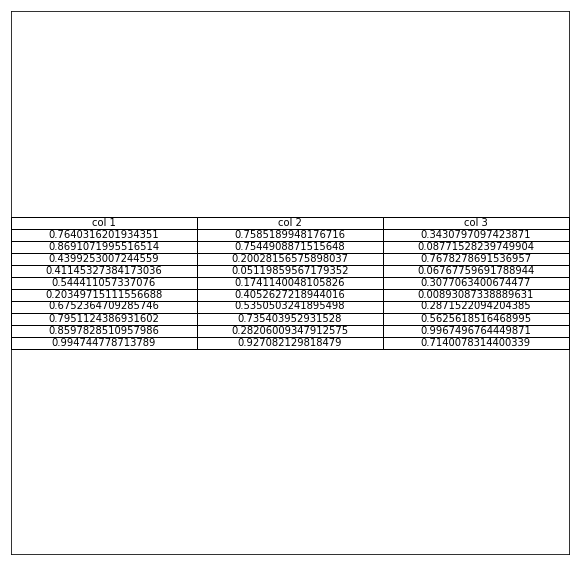

In [37]:
fig, ax = plt.subplots(figsize=(10,10))

# Hide axes
ax.xaxis.set_visible(False) 
ax.yaxis.set_visible(False)

# Table from Ed Smith answer
clust_data = np.random.random((10,3))
collabel=("col 1", "col 2", "col 3")
ax.table(cellText=clust_data,colLabels=collabel,loc='center', 
         cellLoc='center', rowLoc='center', colLoc='center')
plt.show()

#### Concatenation (pour nuages de mots avec 2grams

In [157]:
liste=['bla', 'bli', 'blu', 'ble']

In [162]:
liste_test=[]
n=len(liste)
for i in range(n-1):
    liste_test.append(liste[i]+'_'+liste[i+1])

for i in range(n-2):
    liste_test.append(liste[i]+'_'+liste[i+1]+'_'+liste[i+2])

In [163]:
liste_test

['bla_bli', 'bli_blu', 'blu_ble', 'bla_bli_blu', 'bli_blu_ble']